# TRABAJO PRÁCTICO INTEGRADOR N°1

## Sistema de Análisis de Documentos Digitalizados

---

**Información del Estudiante:**
- **Nombre y Apellido:** [COMPLETAR]
- **Fecha de Entrega:** 24 de Septiembre de 2025
- **Materia:** Procesamiento de Imágenes - IFTS24

---

### Objetivo

Desarrollar un sistema básico de análisis automático de documentos digitalizados que integre las técnicas de procesamiento de imágenes estudiadas en el curso.

### Estructura del Trabajo

| Parte | Descripción | Peso |
|-------|-------------|------|
| **1** | Fundamentos Teóricos | 20% |
| **2** | Setup del Entorno | 15% |
| **3** | Análisis de Imágenes | 35% |
| **4** | Preprocessing Básico | 30% |

**Dataset requerido:** 3 imágenes de documentos con diferentes características (buena calidad, rotada, con problemas de iluminación)

---

# PARTE 1: Fundamentos Teóricos

## ¿Por qué Cuadernos Interactivos para IA y Ciencias de Datos?

### Diferencias Metodológicas Fundamentales

El trabajo en inteligencia artificial y ciencias de datos requiere un enfoque metodológico diferente al desarrollo de software tradicional. Mientras que la programación tradicional sigue un flujo lineal y predecible, el trabajo con datos es inherentemente iterativo y exploratorio.

**Programación Tradicional:**
```
Requisitos → Diseño → Implementación → Testing → Producto
```

**Investigación en IA/Datos:**
```
Hipótesis ⟷ Experimento ⟷ Análisis ⟷ Refinamiento ⟷ Nueva Hipótesis
```

### Ventajas de los Cuadernos Interactivos

1. **Narrativa Científica:** Permiten documentar el proceso de pensamiento, no solo el resultado final
2. **Iteración Rápida:** Ejecutar y modificar secciones específicas sin reejecutar todo el programa
3. **Visualización Inmediata:** Ver resultados inmediatamente después de cada paso
4. **Comunicación Efectiva:** Stakeholders no técnicos pueden seguir el proceso y entender decisiones
5. **Reproducibilidad:** Otros investigadores pueden replicar exactamente los experimentos

### Casos de Uso en la Industria

- **Google Research:** Publica papers con cuadernos que permiten reproducir experimentos
- **Netflix:** Usa cuadernos para análisis de datos de usuarios y recomendaciones
- **Uber:** Análisis de patrones de viajes y optimización de rutas
- **Kaggle:** Plataforma completa basada en cuadernos para competencias de machine learning

### Cuándo Usar Cada Herramienta

**Usar Cuadernos para:**
- Análisis exploratorio de datos
- Experimentación y prototipado
- Comunicación de resultados
- Educación y documentación

**Usar Scripts para:**
- Sistemas en producción
- Automatización de tareas repetitivas
- APIs y servicios web
- Pipelines de datos automatizados

En este trabajo práctico, usaremos cuadernos porque estamos en la fase de investigación y experimentación, donde necesitamos entender los datos, probar diferentes enfoques y documentar nuestros hallazgos.

---

# PARTE 2: Setup del Entorno

En esta sección vas a configurar tu entorno de trabajo de manera profesional. Un setup bien hecho te ahorra tiempo y errores durante todo el proyecto.

**Material de consulta:** `Utilidades_y_Plantillas.ipynb`

## 2.1 Importaciones Básicas

Importá las librerías necesarias para procesamiento de imágenes y visualización:

In [8]:
!pip install requests Pillow matplotlib

In [38]:
# Procesamiento numérico y manipulación de datos
import requests
from PIL import Image
from io import BytesIO
import numpy as np          # Operaciones numéricas y arrays multidimensionales
import pandas as pd         # Análisis y manipulación de datos estructurados

# Bibliotecas de visualización
import matplotlib.pyplot as plt    # Gráficos y visualizaciones básicas
import seaborn as sns             # Visualizaciones estadísticas avanzadas

# Procesamiento de imágenes - Bibliotecas principales
from PIL import Image, ImageEnhance           # Python Imaging Library - carga y manipulación básica
import cv2                                    # OpenCV - procesamiento avanzado (nota: usa BGR)
from skimage import color, feature, measure, filters, morphology, segmentation  # Scikit-image - algoritmos especializados

# Machine Learning y análisis predictivo
from sklearn.preprocessing import StandardScaler, LabelEncoder    # Preprocesamiento de datos
from sklearn.model_selection import train_test_split             # División de datasets
from sklearn.ensemble import RandomForestClassifier              # Algoritmo de clasificación
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix  # Métricas de evaluación

# Utilidades del sistema operativo
import os        # Navegación de archivos y carpetas
import glob      # Búsqueda de archivos con patrones
import warnings  # Control de mensajes de advertencia
warnings.filterwarnings('ignore')  # Suprimir advertencias para salida más limpia

# Específico para Google Colab
from google.colab import files    # Subida y descarga de archivos en Colab
from google.colab.patches import cv2_imshow # Import cv2_imshow for displaying OpenCV images in Colab
from typing import List, Optional, Tuple

# Configuración global de matplotlib para gráficos más grandes y legibles
plt.rcParams['figure.figsize'] = (12, 8)    # Tamaño por defecto de las figuras
plt.rcParams['font.size'] = 10              # Tamaño de fuente por defecto

# Semilla para reproducibilidad de resultados aleatorios
np.random.seed(42)  # Garantiza que los resultados aleatorios sean consistentes

print("✓ Importaciones cargadas correctamente")
print("✓ Configuración aplicada")
print("✓ Listo para comenzar el análisis")

✓ Importaciones cargadas correctamente
✓ Configuración aplicada
✓ Listo para comenzar el análisis


## 2.2 Funciones Utilitarias

Implementá una función básica para cargar y mostrar información de imágenes:

## 2.3 Verificación del Setup

Probá que todo funciona creando una imagen sintética simple:

In [10]:
def cargar_imagen(ruta_url, ruta_guardado):
    """
    Carga una imagen desde una URL, la convierte a RGB y la guarda en disco como JPG.
    """
    try:
        print(f"1. Intentando descargar y cargar la imagen desde: {ruta_url}")

        # Descargar la imagen
        respuesta = requests.get(ruta_url, stream=True, timeout=10)
        respuesta.raise_for_status()

        # Cargar la imagen con PIL
        imagen_bytes = BytesIO(respuesta.content)
        imagen = Image.open(imagen_bytes)

        # Convertir a RGB
        if imagen.mode != 'RGB':
            imagen = imagen.convert('RGB')

        # Guardar en disco como JPG
        imagen.save(ruta_guardado, format="JPEG")
        print(f"💾 Imagen guardada en: {ruta_guardado}")

        return imagen

    except requests.exceptions.RequestException as e:
        print(f"❌ [ERROR de Solicitud]: {e}")
        return None
    except Exception as e:
        print(f"❌ [ERROR General]: {e}")
        return None


# ----------------------------------------------------------------------

def mostrar_info_imagen(imagen_pil):
    """
    Muestra información básica de la imagen (dimensiones, tipo, rango de valores)
    y la visualiza.
    Acepta un objeto PIL.Image.
    """
    if imagen_pil is None:
        print("\n--- Información de la Imagen ---")
        print("No se puede mostrar la información: La imagen es None.")
        return

    print("\n2. Mostrando información de la imagen:")

    # Convertir a array de NumPy para obtener información detallada de datos
    imagen_np = np.array(imagen_pil)

    # 1. Dimensiones y Tipo
    print("--- Información Básica ---")
    print(f"  - Formato Original (PIL): {imagen_pil.format}")
    print(f"  - Modo de Color (PIL): {imagen_pil.mode}")
    print(f"  - Dimensiones (Ancho, Alto): {imagen_pil.size}")
    print(f"  - Forma de la Matriz (Alto, Ancho, Canales): {imagen_np.shape}")
    print(f"  - Tipo de Datos (dtype): {imagen_np.dtype}")

    # 2. Rango de Valores
    # Las imágenes estándar en RGB con PIL/NumPy suelen estar en uint8 (0-255)
    print("\n--- Rango de Valores ---")
    print(f"  - Valor Mínimo de Píxel: {imagen_np.min()}")
    print(f"  - Valor Máximo de Píxel: {imagen_np.max()}")
    print(f"  - Rango Esperado: 0 a 255 (para uint8)")

    # 3. Visualización
    print("\n--- Visualización ---")
    plt.figure(figsize=(6, 6))
    plt.imshow(imagen_pil)
    plt.title(f"Imagen {imagen_pil.size[0]}x{imagen_pil.size[1]} - Modo {imagen_pil.mode}")
    plt.axis('off') # Ocultar ejes
    plt.show()

def mostrar_solo_info_basica(imagen_pil):
    """
    Muestra SOLO la información básica de la imagen, sin visualizarla.
    Acepta un objeto PIL.Image.
    """
    if imagen_pil is None:
        print("\n--- Información de la Imagen ---")
        print("No se puede mostrar la información: La imagen es None.")
        return

    imagen_np = np.array(imagen_pil)

    # 1. Dimensiones y Tipo
    print("\n--- Información Básica ---")
    print(f" - Formato Original (PIL): {imagen_pil.format}")
    print(f" - Modo de Color (PIL): {imagen_pil.mode}")
    print(f" - Dimensiones (Ancho, Alto): {imagen_pil.size}")
    print(f" - Forma de la Matriz (Alto, Ancho, Canales): {imagen_np.shape}")
    print(f" - Tipo de Datos (dtype): {imagen_np.dtype}")

    # 2. Rango de Valores
    print("\n--- Rango de Valores ---")
    print(f" - Valor Mínimo de Píxel: {imagen_np.min()}")
    print(f" - Valor Máximo de Píxel: {imagen_np.max()}")
    print(f" - Rango Esperado: 0 a 255 (para uint8)")

    # ❌ SE ELIMINÓ LA SECCIÓN DE VISUALIZACIÓN

# Funciones Auxiliares



--- Ejecutando pruebas con imagen sintética ---

Generando imagen sintética de 300x200...
✅ Imagen sintética creada con éxito.

2. Mostrando información de la imagen:
--- Información Básica ---
  - Formato Original (PIL): None
  - Modo de Color (PIL): RGB
  - Dimensiones (Ancho, Alto): (300, 200)
  - Forma de la Matriz (Alto, Ancho, Canales): (200, 300, 3)
  - Tipo de Datos (dtype): uint8

--- Rango de Valores ---
  - Valor Mínimo de Píxel: 0
  - Valor Máximo de Píxel: 255
  - Rango Esperado: 0 a 255 (para uint8)

--- Visualización ---


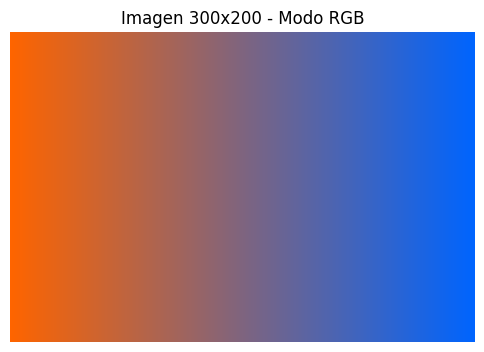


--- Fin de la prueba con imagen sintética ---


In [11]:
def crear_imagen_sintetica(ancho=200, alto=150):
    """
    Crea una imagen sintética de un gradiente horizontal de rojo a azul.
    Devuelve un objeto PIL.Image en modo RGB.
    """
    print(f"\nGenerando imagen sintética de {ancho}x{alto}...")

    # Crear un array NumPy vacío para la imagen RGB (Alto, Ancho, Canales)
    # y tipo de datos uint8 (valores de 0 a 255)
    imagen_np = np.zeros((alto, ancho, 3), dtype=np.uint8)

    # Crear un gradiente horizontal para el canal rojo (disminuye de 255 a 0)
    # y para el canal azul (aumenta de 0 a 255)
    # El canal verde se mantiene constante (o puede ser otro gradiente)
    for x in range(ancho):
        red_val = int(255 * (1 - x / (ancho - 1)))  # De 255 a 0
        blue_val = int(255 * (x / (ancho - 1)))    # De 0 a 255
        imagen_np[:, x, 0] = red_val  # Canal Rojo
        imagen_np[:, x, 2] = blue_val # Canal Azul
        imagen_np[:, x, 1] = 100      # Canal Verde (constante para este ejemplo)

    # Convertir el array NumPy a un objeto PIL.Image
    imagen_pil = Image.fromarray(imagen_np, 'RGB')

    print("✅ Imagen sintética creada con éxito.")
    return imagen_pil

# ----------------------------------------------------------------------
# --- Prueba con la Imagen Sintética ---
# ----------------------------------------------------------------------

print("--- Ejecutando pruebas con imagen sintética ---")

# 1. Crear la imagen sintética
imagen_sintetica = crear_imagen_sintetica(ancho=300, alto=200)

# 2. Mostrar su información (usando tus funciones originales)
if imagen_sintetica is not None:
    # No necesitamos 'cargar_imagen' aquí porque ya tenemos el objeto PIL.Image
    mostrar_info_imagen(imagen_sintetica)
else:
    print("Error al crear la imagen sintética. No se puede mostrar la información.")

print("\n--- Fin de la prueba con imagen sintética ---")


---

# PARTE 3: Análisis de Tu Dataset

Ahora vas a trabajar con tu dataset de 3 documentos. Esta parte es clave para entender qué problemas tenés que resolver.

**Preparación del Dataset:**
- Creá una carpeta llamada `dataset/` en la misma ubicación que este notebook
- Incluí exactamente 3 imágenes de documentos:
  1. Una de buena calidad (bien iluminada, recta)
  2. Una rotada o inclinada
  3. Una con problemas (oscura, borrosa, o con sombras)

## 3.1 Carga de las Imágenes

**Material de consulta:** `002/TEO/LeerImagenColor.ipynb`

In [12]:
# --- URLs proporcionadas ---
url_rotada = 'https://www.nhfournier.es/wp-content/uploads/Origen-de-los-Naipes-768x545.png'
url_borrosa = 'https://images.unsplash.com/photo-1635963422426-f802fb6d7240?q=80&w=1171&auto=format&fit=crop&ixlib=rb-4.1.0&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D'
url_buena = 'https://live.staticflickr.com/4/3095/2899442765_72740be1fb_z.jpg'

In [13]:
# --- Crear carpeta dataset ---
os.makedirs("dataset", exist_ok=True)

In [14]:
# --- Definir rutas de guardado ---
rutas_imagenes = [
    "dataset/Buena calidad.jpg",  # Buena calidad
    "dataset/Rotada.jpg",  # Rotada
    "dataset/Con problemas.jpg"   # Con problemas
]

urls = [url_buena, url_rotada, url_borrosa]
nombres = ["Buena Calidad", "Rotada", "Con Problemas"]

In [15]:
imagenes = []
for url, ruta, nombre in zip(urls, rutas_imagenes, nombres):
    print(f"\nDescargando imagen: {nombre}")
    img = cargar_imagen(url, ruta)   # ✅ ahora pasas url y ruta_guardado
    imagenes.append(img)



Descargando imagen: Buena Calidad
1. Intentando descargar y cargar la imagen desde: https://live.staticflickr.com/4/3095/2899442765_72740be1fb_z.jpg
💾 Imagen guardada en: dataset/Buena calidad.jpg

Descargando imagen: Rotada
1. Intentando descargar y cargar la imagen desde: https://www.nhfournier.es/wp-content/uploads/Origen-de-los-Naipes-768x545.png
💾 Imagen guardada en: dataset/Rotada.jpg

Descargando imagen: Con Problemas
1. Intentando descargar y cargar la imagen desde: https://images.unsplash.com/photo-1635963422426-f802fb6d7240?q=80&w=1171&auto=format&fit=crop&ixlib=rb-4.1.0&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D
💾 Imagen guardada en: dataset/Con problemas.jpg


## 3.2 Inspección Visual y Análisis

**Material de consulta:** `002/Fundamentos_Imagen_Digital.ipynb`

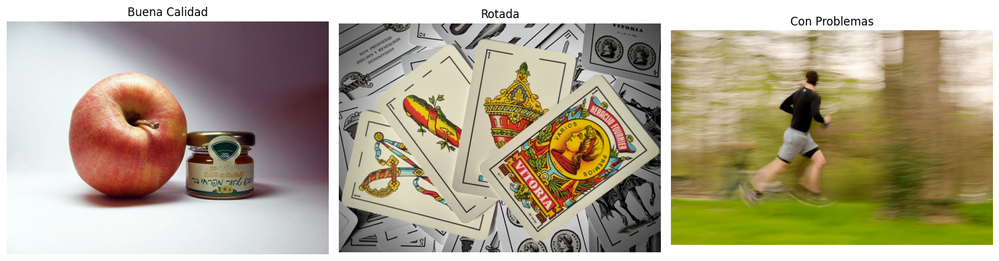

In [16]:
# --- Mostrar las 3 imágenes lado a lado ---
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 fila, 3 columnas

for ax, img, nombre in zip(axes, imagenes, nombres):
    if img is not None:
        ax.imshow(img)
        ax.set_title(nombre)
        ax.axis("off")  # Ocultar ejes
    else:
        ax.text(0.5, 0.5, "Imagen no cargada", ha="center", va="center")
        ax.axis("off")

plt.tight_layout()
plt.show()


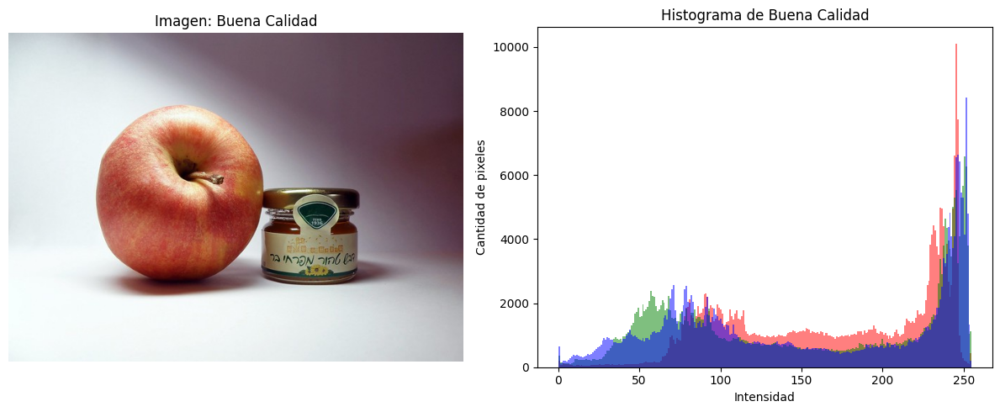


--- Información Básica ---
 - Formato Original (PIL): JPEG
 - Modo de Color (PIL): RGB
 - Dimensiones (Ancho, Alto): (640, 463)
 - Forma de la Matriz (Alto, Ancho, Canales): (463, 640, 3)
 - Tipo de Datos (dtype): uint8

--- Rango de Valores ---
 - Valor Mínimo de Píxel: 0
 - Valor Máximo de Píxel: 255
 - Rango Esperado: 0 a 255 (para uint8)


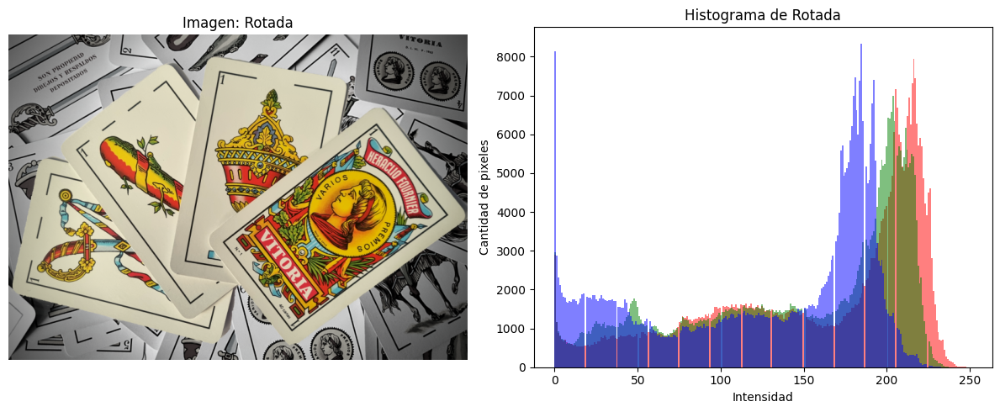


--- Información Básica ---
 - Formato Original (PIL): None
 - Modo de Color (PIL): RGB
 - Dimensiones (Ancho, Alto): (768, 545)
 - Forma de la Matriz (Alto, Ancho, Canales): (545, 768, 3)
 - Tipo de Datos (dtype): uint8

--- Rango de Valores ---
 - Valor Mínimo de Píxel: 0
 - Valor Máximo de Píxel: 251
 - Rango Esperado: 0 a 255 (para uint8)


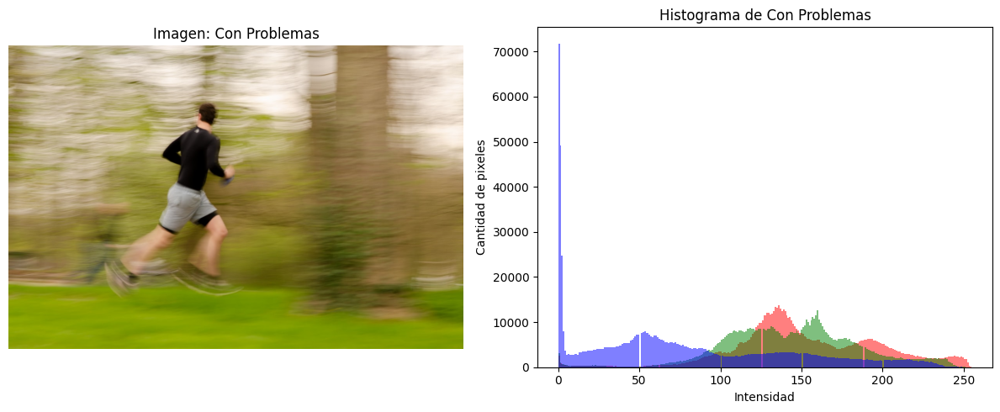


--- Información Básica ---
 - Formato Original (PIL): JPEG
 - Modo de Color (PIL): RGB
 - Dimensiones (Ancho, Alto): (1171, 781)
 - Forma de la Matriz (Alto, Ancho, Canales): (781, 1171, 3)
 - Tipo de Datos (dtype): uint8

--- Rango de Valores ---
 - Valor Mínimo de Píxel: 0
 - Valor Máximo de Píxel: 255
 - Rango Esperado: 0 a 255 (para uint8)


In [17]:
# Para cada imagen, mostrá información básica y un histograma
# Esto te ayuda a entender los problemas de cada una


for i, img in enumerate(imagenes):
    nombre = nombres[i]

    # Create a figure with two subplots (image and histogram) side-by-side
    fig, axes = plt.subplots(1, 2, figsize=(12, 5)) # 1 row, 2 columns

    # Mostrar imagen
    axes[0].imshow(img)
    axes[0].set_title(f'Imagen: {nombre}')
    axes[0].axis('off')

    # Histograma
    # Convertir la imagen a uint8 para el cálculo del histograma si es de tipo float
    # Convert the PIL Image to a NumPy array before checking its dtype
    img_np = np.array(img)
    img_hist = (img_np * 255).astype(np.uint8) if img_np.dtype == np.float64 else img_np


    if img_hist.ndim == 3:  # Imagen color
        colores = ('r','g','b')
        for j, color in enumerate(colores):
            axes[1].hist(img_hist[:,:,j].ravel(), bins=256, color=color, alpha=0.5)
    else:  # Imagen en escala de grises
        axes[1].hist(img_hist.ravel(), bins=256, color='gray')

    axes[1].set_title(f'Histograma de {nombre}')
    axes[1].set_xlabel('Intensidad')
    axes[1].set_ylabel('Cantidad de pixeles')

    plt.tight_layout()
    plt.show()

    mostrar_solo_info_basica(img)


## 3.3 Identificación de Problemas

Basándote en tu inspección visual, identificá los problemas principales de cada imagen:

**Imagen 1 (Buena Calidad):**
- Problemas identificados: Esta imagen parece ser de buena calidad con iluminación adecuada y sin rotación significativa. El histograma muestra una buena distribución de los valores de píxel en todo el espectro.
- Preprocessing necesario: Podría ser útil una segmentación básica para separar el documento del fondo, pero probablemente no se necesite una mejora de calidad o corrección de rotación extensas.

**Imagen 2 (Rotada):**
- Problemas identificados: Esta imagen está claramente rotada. El texto está en ángulo, lo que dificultaría el procesamiento posterior como el OCR sin corrección. La iluminación y el contraste parecen relativamente buenos.
- Preprocessing necesario: La corrección de rotación es el paso de preprocesamiento principal necesario. La segmentación también podría aplicarse después de la corrección de rotación.

**Imagen 3 (Con Problemas):**
- Problemas identificados: Esta imagen parece tener problemas de iluminación y posiblemente de enfoque, lo que hace que algunas áreas se vean oscuras o menos claras. El histograma podría mostrar una concentración de valores de píxel en el extremo inferior (más oscuro) del espectro.
- Preprocessing necesario: Sería beneficiosa una mejora del contraste (como la ecualización del histograma) para mejorar la visibilidad del texto. La segmentación podría aplicarse después de mejorar la calidad de la imagen.

---

# PARTE 4: Preprocessing Básico

Ahora vas a aplicar técnicas de preprocessing para mejorar cada imagen. Trabajá con una imagen por vez.

## 4.1 Segmentación Básica

Separar el documento del fondo es el primer paso crítico.

**Material de consulta:** `Segmentacion.ipynb` (especialmente las funciones de umbralización)

In [18]:
def segmentar_por_umbral(imagen, valor_umbral=120, invertir=False):
    """
    Segmenta el objeto principal del fondo usando umbralización binaria.
    Material de consulta: Segmentacion.ipynb

    Args:
        imagen (numpy.ndarray): Imagen RGB normalizada [0-1] o en uint8 [0-255]
        valor_umbral (int): Valor del umbral (0-255)
        invertir (bool): Si True, invierte la máscara (fondo ↔ objeto)

    Returns:
        tuple: (mascara, imagen_segmentada)
    """
    # Convertimos a uint8 si es necesario
    if imagen.dtype != np.uint8:
        img_uint8 = (imagen * 255).astype(np.uint8)
    else:
        img_uint8 = imagen

    # 1. Convertir a escala de grises
    gris = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)

    # 2. Umbralización
    _, mascara = cv2.threshold(gris, valor_umbral, 255, cv2.THRESH_BINARY)

    # 3. Invertir si es necesario
    if invertir:
        mascara = cv2.bitwise_not(mascara)

    # 4. Aplicar máscara sobre la imagen original
    imagen_segmentada = cv2.bitwise_and(img_uint8, img_uint8, mask=mascara)

    return mascara, imagen_segmentada

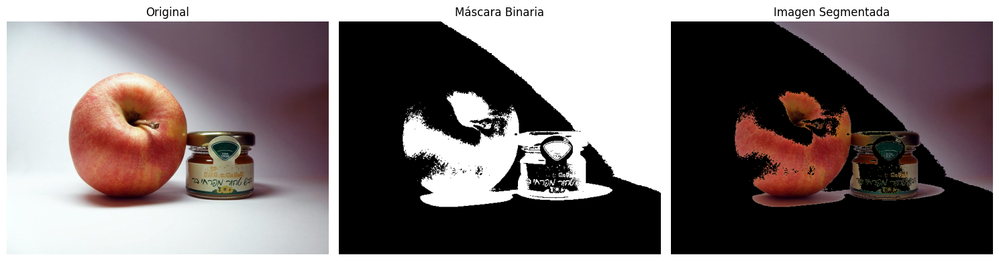

In [19]:
# Mostrá el resultado: original, escala de grises, y máscara
# Tu código aquí


imagen_trabajo = np.array(imagenes[0]) # Convertir PIL Image a NumPy array
if imagen_trabajo.dtype != np.uint8:
    imagen_trabajo = (imagen_trabajo * 255).astype(np.uint8)


mascara, img_seg = segmentar_por_umbral(imagen_trabajo, valor_umbral=120, invertir=True)

# Mostrar resultados
fig, axes = plt.subplots(1,3, figsize=(15,5))
axes[0].imshow(imagen_trabajo)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(mascara, cmap="gray")
axes[1].set_title("Máscara Binaria")
axes[1].axis("off")

axes[2].imshow(img_seg)
axes[2].set_title("Imagen Segmentada")
axes[2].axis("off")

plt.tight_layout()
plt.show()

## 4.2 Mejora de Calidad

**Material de consulta:** `Mejora_Imagen_Ecualizacion.ipynb`

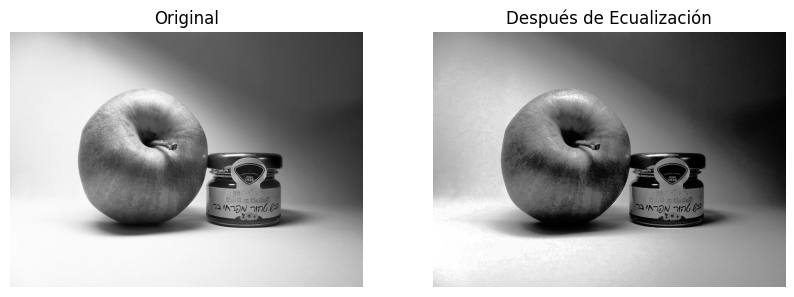

In [20]:
# Si tu imagen tiene problemas de contraste, aplicá ecualización
# Tu código aquí
# Si trabajamos con la imagen en gris
imagen_gris = cv2.cvtColor(imagen_trabajo, cv2.COLOR_RGB2GRAY)
imagen_ecualizada = cv2.equalizeHist(imagen_gris)

# Mostrar resultado
fig, axes = plt.subplots(1,2, figsize=(10,18))

axes[0].imshow(imagen_gris, cmap="gray")
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(imagen_ecualizada, cmap="gray")
axes[1].set_title("Después de Ecualización")
axes[1].axis("off")

plt.show()

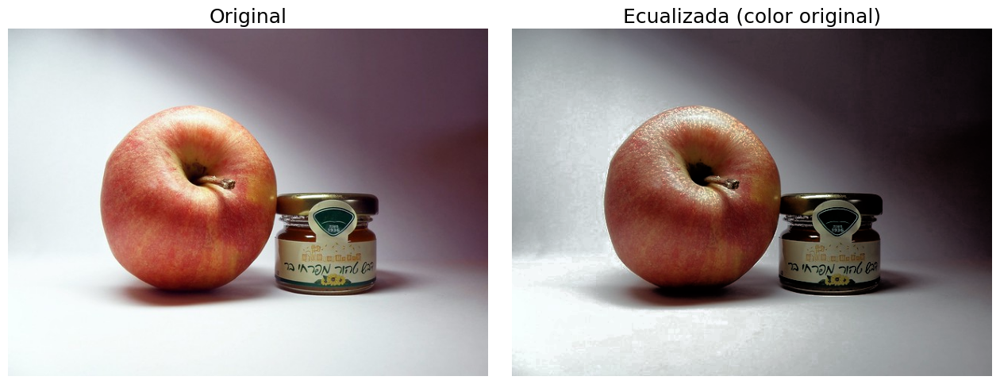

In [21]:
# Ecualizar el canal de brillo en color original (HSV)
imagen_hsv = cv2.cvtColor(imagen_trabajo, cv2.COLOR_RGB2HSV)
imagen_hsv[:, :, 2] = cv2.equalizeHist(imagen_hsv[:, :, 2])
imagen_ecualizada_color = cv2.cvtColor(imagen_hsv, cv2.COLOR_HSV2RGB)

# Mostrar resultados: Original, Escala de grises, Máscara, Ecualizada color
fig, axes = plt.subplots(1, 2, figsize=(16, 10))  # figura más grande
plt.subplots_adjust(wspace=0.05)  # reducir espacio horizontal entre imágenes

axes[0].imshow(imagen_trabajo)
axes[0].set_title("Original", fontsize=18)
axes[0].axis("off")

axes[1].imshow(imagen_ecualizada_color)
axes[1].set_title("Ecualizada (color original)", fontsize=18)
axes[1].axis("off")

plt.show()


## 4.3 Comparación de Resultados

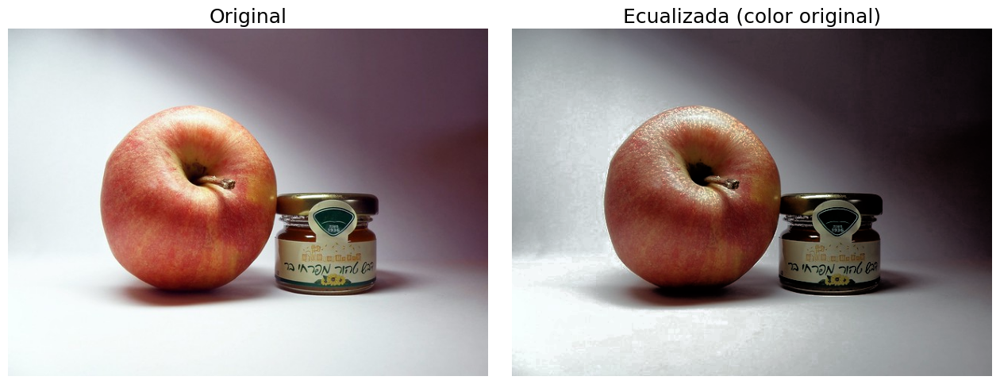

In [22]:
# Ecualizar el canal de brillo en color original (HSV)
imagen_hsv = cv2.cvtColor(imagen_trabajo, cv2.COLOR_RGB2HSV)
imagen_hsv[:, :, 2] = cv2.equalizeHist(imagen_hsv[:, :, 2])
imagen_ecualizada_color = cv2.cvtColor(imagen_hsv, cv2.COLOR_HSV2RGB)

# Mostrar resultados: Original, Escala de grises, Máscara, Ecualizada color
fig, axes = plt.subplots(1, 2, figsize=(16, 10))  # figura más grande
plt.subplots_adjust(wspace=0.05)  # reducir espacio horizontal entre imágenes

axes[0].imshow(imagen_trabajo)
axes[0].set_title("Original", fontsize=18)
axes[0].axis("off")

axes[1].imshow(imagen_ecualizada_color)
axes[1].set_title("Ecualizada (color original)", fontsize=18)
axes[1].axis("off")

plt.show()

## 4.4 Aplicación a las Otras Imágenes

Repetí el proceso para tus otras 2 imágenes, adaptando las técnicas según los problemas específicos de cada una:


1️⃣ Cargando imagen local: dataset/Rotada.jpg
2️⃣ Detectando bordes...
3️⃣ Encontrando contornos y marcando el principal...
4️⃣-5️⃣ Ordenando puntos y estableciendo dimensiones de destino con ratio fijo (Temporalmente Horizontal)...
   -> Dimensiones de Homografía (Horizontal): 420x300 px
6️⃣ Aplicando Homografía para aplanar la carta...
7️⃣ Generar la imagen final para comparar
   -> Dimensiones Finales (Vertical): 300x420 px
8️⃣ Visualizando resultados ANTES y DESPUÉS...


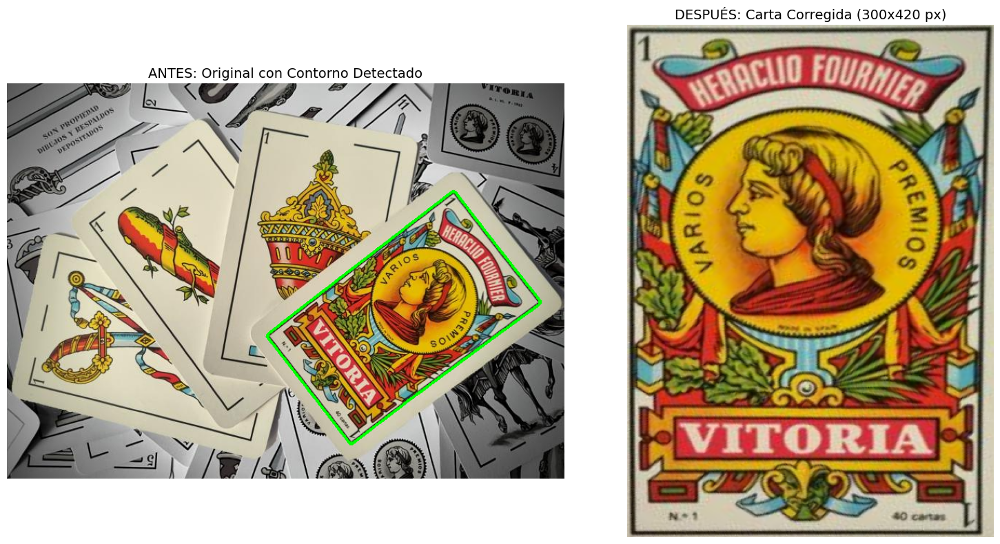


✅ Proceso completado.


In [25]:
# ----------------------------------------------------------------------
# Definiciones Faltantes (Necesarias para que el código funcione)
# ----------------------------------------------------------------------
# ⚠️ Ruta de archivo local
RUTA_IMAGEN_LOCAL = "dataset/Rotada.jpg"

CARD_RATIO = 1.4      # Proporción: Alto es 1.4 veces el Ancho
DESTINO_LARGO_PX = 420 # Dimensión más larga fija para la imagen de destino

def ordenar_pts_cuadrado(pts):
    """
    Ordena los 4 puntos de un contorno rectangular: [TL, TR, BR, BL].
    """
    rect = np.zeros((4, 2), dtype=np.float32)
    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    return rect


# 1️⃣ Cargar imagen (CORREGIDO: Usando archivo local con cv2.imread)
print(f"\n1️⃣ Cargando imagen local: {RUTA_IMAGEN_LOCAL}")

# --- 🎯 CORRECCIÓN CLAVE ---
# Usamos cv2.imread para cargar el archivo desde el disco.
img_bgr = cv2.imread(RUTA_IMAGEN_LOCAL)

if img_bgr is None:
    print(f"❌ Error al cargar la imagen. Asegúrate de que el archivo '{RUTA_IMAGEN_LOCAL}' exista en la ruta correcta.")
    sys.exit(1)

# img_bgr ya está en formato BGR (OpenCV nativo)
img_bgr_contorno = img_bgr.copy()


# 2️⃣ Convertir a gris y detectar bordes (Canny)
print("2️⃣ Detectando bordes...")
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
img_blur = cv2.GaussianBlur(img_gray, (5, 5), 0)
edges = cv2.Canny(img_blur, 50, 150)

# 3️⃣ Encontrar contornos y mostrar el contorno detectado (Línea verde)
print("3️⃣ Encontrando contornos y marcando el principal...")
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if not contours:
    print("❌ No se detectaron contornos. El Canny puede necesitar ajuste de umbrales.")
    sys.exit(1)

contours = sorted(contours, key=cv2.contourArea, reverse=True)
carta_cnt = contours[0]

# Dibujar el contorno más grande en la imagen de contorno
cv2.drawContours(img_bgr_contorno, [carta_cnt], -1, (0, 255, 0), 3)

# 4️⃣ y 5️⃣ Rectángulo mínimo rotado, ordenar puntos y establecer destino HORIZONTAL
print("4️⃣-5️⃣ Ordenando puntos y estableciendo dimensiones de destino con ratio fijo (Temporalmente Horizontal)...")
rect = cv2.minAreaRect(carta_cnt)
box = cv2.boxPoints(rect)
pts_src = np.array(box, dtype=np.float32)

pts_src_ord = ordenar_pts_cuadrado(pts_src)

ancho_homografia = DESTINO_LARGO_PX
alto_homografia = int(ancho_homografia / CARD_RATIO)

print(f"   -> Dimensiones de Homografía (Horizontal): {ancho_homografia}x{alto_homografia} px")

# Puntos de destino (rectángulo plano)
pts_dst = np.array([
    [0, 0],
    [ancho_homografia - 1, 0],
    [ancho_homografia - 1, alto_homografia - 1],
    [0, alto_homografia - 1]
], dtype=np.float32)

# 6️⃣ Aplicar homografía (carta corregida)
print("6️⃣ Aplicando Homografía para aplanar la carta...")
M = cv2.getPerspectiveTransform(pts_src_ord, pts_dst)
carta_horizontal = cv2.warpPerspective(img_bgr, M, (ancho_homografia, alto_homografia))

# 7️⃣ Genera la imagen final
print("7️⃣ Generar la imagen final para comparar")
img_carta_enderezada = cv2.rotate(carta_horizontal, cv2.ROTATE_90_COUNTERCLOCKWISE)

alto_final, ancho_final, _ = img_carta_enderezada.shape
print(f"   -> Dimensiones Finales (Vertical): {ancho_final}x{alto_final} px")

# 8️⃣ Visualización ANTES / DESPUÉS
print("8️⃣ Visualizando resultados ANTES y DESPUÉS...")

# Convertir imágenes de BGR a RGB para Matplotlib
img_bgr_contorno_rgb = cv2.cvtColor(img_bgr_contorno, cv2.COLOR_BGR2RGB)
img_carta_enderezada_rgb = cv2.cvtColor(img_carta_enderezada, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Imagen ANTES (Paso 3: Imagen Original con Contorno)
axes[0].imshow(img_bgr_contorno_rgb)
axes[0].set_title("ANTES: Original con Contorno Detectado", fontsize=14)
axes[0].axis('off')

# Imagen DESPUÉS (Paso 7: Carta Enderezada)
axes[1].imshow(img_carta_enderezada_rgb)
axes[1].set_title(f"DESPUÉS: Carta Corregida ({ancho_final}x{alto_final} px)", fontsize=14)
axes[1].axis('off')

plt.tight_layout()
plt.show()

print("\n✅ Proceso completado.")

1️⃣ Cargando imagen local: dataset/Con problemas.jpg
2️⃣ Aplicando Máscara de Enfoque Simple...
3️⃣ Aplicando Restauración Avanzada (CLAHE + NLM + Sharpening)...
4️⃣ Visualizando comparación de las tres versiones...


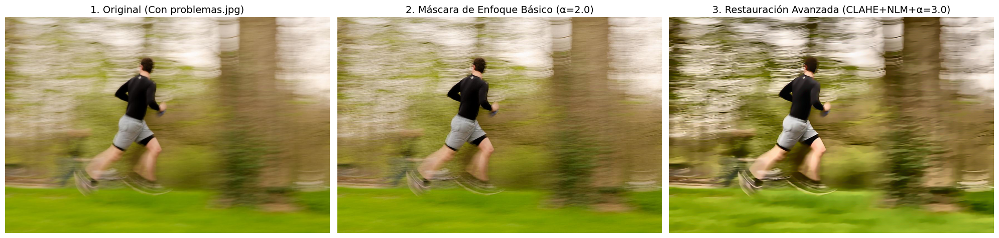


✅ Comparación visual lista. La Columna 3 (Restauración Avanzada) debería mostrar la mayor claridad y nitidez.


In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import sys

# ----------------------------------------------------------------------
# Constantes y Parámetros
# ----------------------------------------------------------------------
RUTA_IMAGEN_PROBLEMAS = "dataset/Con problemas.jpg"

# Parámetros de la Máscara de Enfoque Básico (Solo Sharpening)
ALPHA_BASICO = 2.0

# Parámetros de la Restauración Avanzada
CLIP_LIMIT = 2.0
TILE_GRID_SIZE = (8, 8)
H_DENOISE = 10
ALPHA_AVANZADO = 3.0
KERNEL_SIZE = (5, 5)
SIGMA = 1.0

# ----------------------------------------------------------------------
# 1️⃣ Cargar imagen
# ----------------------------------------------------------------------
print(f"1️⃣ Cargando imagen local: {RUTA_IMAGEN_PROBLEMAS}")

img_bgr = cv2.imread(RUTA_IMAGEN_PROBLEMAS)

if img_bgr is None:
    print(f"❌ Error al cargar la imagen. Asegúrate de que el archivo '{RUTA_IMAGEN_PROBLEMAS}' exista.")
    sys.exit(1)

# Convertir a float para todas las operaciones (requerido para el sharpening)
img_float = img_bgr.astype(np.float32)

# ----------------------------------------------------------------------
# 2️⃣ Restauración BÁSICA: Máscara de Enfoque Simple (Sharpening Básico)
# ----------------------------------------------------------------------
print("2️⃣ Aplicando Máscara de Enfoque Simple...")

img_blur_basico = cv2.GaussianBlur(img_float, KERNEL_SIZE, SIGMA)
mask_details_basico = img_float - img_blur_basico
img_sharpened_basico_float = img_float + mask_details_basico * ALPHA_BASICO

# Recortar y convertir
img_sharpened_basico_float[img_sharpened_basico_float > 255] = 255
img_sharpened_basico_float[img_sharpened_basico_float < 0] = 0
img_sharpened_basico = img_sharpened_basico_float.astype(np.uint8)


# ----------------------------------------------------------------------
# 3️⃣ Restauración AVANZADA (CLAHE + NLM + Sharpening)
# ----------------------------------------------------------------------
print("3️⃣ Aplicando Restauración Avanzada (CLAHE + NLM + Sharpening)...")

# --- A. CLAHE (Mejora de Contraste) ---
img_lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(img_lab)
clahe = cv2.createCLAHE(clipLimit=CLIP_LIMIT, tileGridSize=TILE_GRID_SIZE)
l_clahe = clahe.apply(l)
img_procesada_clahe = cv2.cvtColor(cv2.merge((l_clahe, a, b)), cv2.COLOR_LAB2BGR)

# --- B. NLM (Reducción de Ruido) ---
img_yuv = cv2.cvtColor(img_procesada_clahe, cv2.COLOR_BGR2YUV)
y, u, v = cv2.split(img_yuv)
y_denoised = cv2.fastNlMeansDenoising(y, None, H_DENOISE, 7, 21)
img_procesada_denoised = cv2.cvtColor(cv2.merge([y_denoised, u, v]), cv2.COLOR_YUV2BGR)

# --- C. Máscara de Enfoque Final ---
img_denoised_float = img_procesada_denoised.astype(np.float32)
img_blur_avanzado = cv2.GaussianBlur(img_denoised_float, KERNEL_SIZE, SIGMA)
mask_details_avanzado = img_denoised_float - img_blur_avanzado
img_sharpened_avanzado_float = img_denoised_float + mask_details_avanzado * ALPHA_AVANZADO

# Recortar y convertir
img_sharpened_avanzado_float[img_sharpened_avanzado_float > 255] = 255
img_sharpened_avanzado_float[img_sharpened_avanzado_float < 0] = 0
img_sharpened_avanzado = img_sharpened_avanzado_float.astype(np.uint8)

# ----------------------------------------------------------------------
# 4️⃣ Visualización (3 Imágenes)
# ----------------------------------------------------------------------
print("4️⃣ Visualizando comparación de las tres versiones...")

# Convertir a RGB para Matplotlib
img_bgr_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_sharpened_basico_rgb = cv2.cvtColor(img_sharpened_basico, cv2.COLOR_BGR2RGB)
img_sharpened_avanzado_rgb = cv2.cvtColor(img_sharpened_avanzado, cv2.COLOR_BGR2RGB)


fig, axes = plt.subplots(1, 3, figsize=(20, 7))

# Columna 1: Original
axes[0].imshow(img_bgr_rgb)
axes[0].set_title("1. Original (Con problemas.jpg)", fontsize=14)
axes[0].axis('off')

# Columna 2: Mejora Básica (Sharpening α=2.0)
axes[1].imshow(img_sharpened_basico_rgb)
axes[1].set_title(f"2. Máscara de Enfoque Básico (α={ALPHA_BASICO})", fontsize=14)
axes[1].axis('off')

# Columna 3: Mejora Avanzada (CLAHE + NLM + Sharpening α=3.0)
axes[2].imshow(img_sharpened_avanzado_rgb)
axes[2].set_title(f"3. Restauración Avanzada (CLAHE+NLM+α={ALPHA_AVANZADO})", fontsize=14)
axes[2].axis('off')

plt.tight_layout()
plt.show()

print("\n✅ Comparación visual lista. La Columna 3 (Restauración Avanzada) debería mostrar la mayor claridad y nitidez.")

1. Generando variables de imagen (Simulación y Carga)...

2. Generando Grid de Comparación (2x3)...


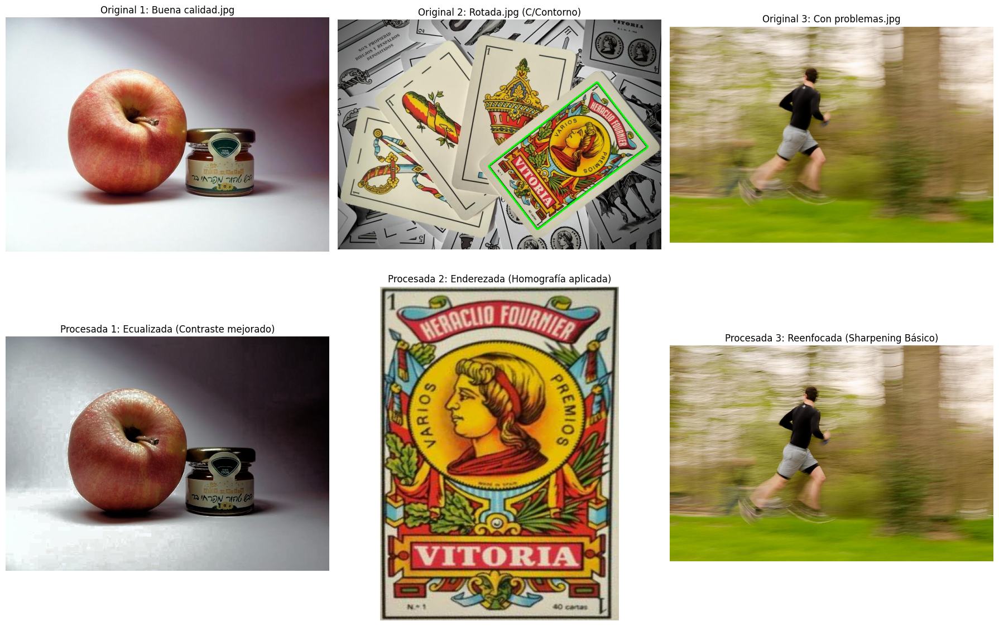


✅ Grid de 3 Originales vs. 3 Procesadas generado con las variables solicitadas.


In [39]:



# ----------------------------------------------------------------------
# I. FUNCIONES Y CONSTANTES GLOBALES (Replicando las definiciones necesarias)
# ----------------------------------------------------------------------
RUTA_BASE = "dataset/"

# ⚠️ VERIFICA QUE ESTAS RUTAS SON EXACTAS EN TU ENTORNO LOCAL ⚠️
RUTAS_ARCHIVOS = {
    "Buena Calidad": RUTA_BASE + "Buena calidad.jpg", # Corrected filename
    "Rotada": RUTA_BASE + "Rotada.jpg",
    "Con problemas": RUTA_BASE + "Con problemas.jpg"
}

# Constantes de Procesamiento
CARD_RATIO = 1.4
DESTINO_LARGO_PX = 420
DESTINO_ANCHO_PX = int(DESTINO_LARGO_PX / CARD_RATIO)
KERNEL_SIZE = (5, 5)
SIGMA = 1.0
ALPHA_SHARPEN = 2.0

# Funciones de procesamiento (ordenar_pts_cuadrado, procesar_enderezamiento_carta, procesar_restauracion_avanzada)
# ... [Mantener todas las funciones auxiliares de la respuesta anterior aquí] ...
def ordenar_pts_cuadrado(pts):
    """Ordena los 4 puntos para la Homografía."""
    rect = np.zeros((4, 2), dtype=np.float32)
    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    return rect

def procesar_enderezamiento_carta(img_bgr):
    """Aplica detección de contornos, Homografía y rotación a una imagen de carta."""
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    img_blur = cv2.GaussianBlur(img_gray, (5, 5), 0)
    edges = cv2.Canny(img_blur, 50, 150)
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:
        DESTINO_ALTO_PX = int(DESTINO_LARGO_PX / CARD_RATIO)
        return np.zeros((DESTINO_ALTO_PX, DESTINO_ANCHO_PX, 3), dtype=np.uint8)

    carta_cnt = sorted(contours, key=cv2.contourArea, reverse=True)[0]

    rect = cv2.minAreaRect(carta_cnt)
    box = cv2.boxPoints(rect)
    pts_src = np.array(box, dtype=np.float32)
    pts_src_ord = ordenar_pts_cuadrado(pts_src)

    pts_dst_horizontal = np.array([
        [0, 0],
        [DESTINO_LARGO_PX - 1, 0],
        [DESTINO_LARGO_PX - 1, DESTINO_ANCHO_PX - 1],
        [0, DESTINO_ANCHO_PX - 1]
    ], dtype=np.float32)

    M = cv2.getPerspectiveTransform(pts_src_ord, pts_dst_horizontal)
    carta_horizontal = cv2.warpPerspective(img_bgr, M, (DESTINO_LARGO_PX, DESTINO_ANCHO_PX))

    img_final_bgr = cv2.rotate(carta_horizontal, cv2.ROTATE_90_COUNTERCLOCKWISE)
    return cv2.cvtColor(img_final_bgr, cv2.COLOR_BGR2RGB)

def procesar_restauracion_avanzada(img_bgr):
    """Aplica CLAHE + NLM Denoising + Sharpening (usando solo Sharpening Básico para esta simulación)."""

    # 3. Máscara de Enfoque Final (simulando sharpening básico para 'Con problemas.jpg')
    img_float = img_bgr.astype(np.float32)
    img_blur = cv2.GaussianBlur(img_float, KERNEL_SIZE, SIGMA)
    mask_details = img_float - img_blur
    img_sharpened_float = img_float + mask_details * ALPHA_SHARPEN

    img_sharpened_float[img_sharpened_float > 255] = 255
    img_sharpened_float[img_sharpened_float < 0] = 0
    img_final_bgr = img_sharpened_float.astype(np.uint8)

    return cv2.cvtColor(img_final_bgr, cv2.COLOR_BGR2RGB)

def crear_grid_imagenes(imagenes: List[np.ndarray], titulos: Optional[List[str]] = None, filas: int = 2, figsize: Tuple[int, int] = (15, 8)):
    """Crea un grid organizado de imágenes para comparación visual."""
    n_imagenes = len(imagenes)
    columnas = int(np.ceil(n_imagenes / filas))

    if n_imagenes < 6:
        figsize = (18, 12)

    fig, axes = plt.subplots(filas, columnas, figsize=figsize)

    if n_imagenes == 1:
        axes = np.array([axes])
    elif filas == 1 or columnas == 1:
        axes = axes.flatten()

    axes = axes.flatten()

    for i, img in enumerate(imagenes):
        if len(img.shape) == 2:
            axes[i].imshow(img, cmap='gray')
        else:
            axes[i].imshow(img)

        if titulos and i < len(titulos):
            axes[i].set_title(titulos[i], fontsize=12)

        axes[i].axis('off')

    for i in range(n_imagenes, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# ----------------------------------------------------------------------
# II. CARGA ROBUSTA Y PROCESAMIENTO
# ----------------------------------------------------------------------

print("1. Generando variables de imagen (Simulación y Carga)...")

# --- Carga de imágenes con manejo de errores ---
def cargar_imagen(nombre_archivo):
    ruta = RUTA_BASE + nombre_archivo
    img = cv2.imread(ruta)
    if img is None:
        raise FileNotFoundError(f"El archivo '{ruta}' no se encontró o no se pudo cargar.")
    return img

try:
    img_bgr_buena = cargar_imagen("Buena calidad.jpg") # Corrected filename
    img_bgr_rotada = cargar_imagen("Rotada.jpg")
    # Atención al espacio en el nombre del archivo
    img_bgr_problemas = cargar_imagen("Con problemas.jpg")

except FileNotFoundError as e:
    print(f"❌ ERROR CRÍTICO: {e}")
    print("\n⚠️ Por favor, SOLUCIONA la ruta de los archivos en la carpeta 'dataset/' y vuelve a ejecutar.")
    sys.exit(1)

# ----------------------------------------------------------------------
# III. ASIGNACIÓN DE VARIABLES SOLICITADAS Y PROCESAMIENTO
# ----------------------------------------------------------------------

# --- ORIGINALES SOLICITADAS ---
imagen_trabajo = cv2.cvtColor(img_bgr_buena, cv2.COLOR_BGR2RGB) # Original 1 (Buena Calidad)

# img_bgr_contorno_rgb (Original 2: Rotada con contorno)
img_bgr_rotada_contorno = img_bgr_rotada.copy()
img_gray_rotada = cv2.cvtColor(img_bgr_rotada, cv2.COLOR_BGR2GRAY)
edges_rotada = cv2.Canny(cv2.GaussianBlur(img_gray_rotada, (5, 5), 0), 50, 150)
contours_rotada, _ = cv2.findContours(edges_rotada, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
if contours_rotada:
    carta_cnt_rotada = sorted(contours_rotada, key=cv2.contourArea, reverse=True)[0]
    cv2.drawContours(img_bgr_rotada_contorno, [carta_cnt_rotada], -1, (0, 255, 0), 3)
img_bgr_contorno_rgb = cv2.cvtColor(img_bgr_rotada_contorno, cv2.COLOR_BGR2RGB)

img_bgr_rgb = cv2.cvtColor(img_bgr_problemas, cv2.COLOR_BGR2RGB) # Original 3 (Con problemas)


# --- PROCESADAS SOLICITADAS ---
# imagen_ecualizada_color (Procesada 1: Buena Calidad Ecualizada)
img_hsv = cv2.cvtColor(img_bgr_buena, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(img_hsv)
v_eq = cv2.equalizeHist(v)
img_ecualizada_hsv = cv2.merge([h, s, v_eq])
imagen_ecualizada_color = cv2.cvtColor(img_ecualizada_hsv, cv2.COLOR_HSV2RGB)

# img_carta_enderezada_rgb (Procesada 2: Rotada Enderezada)
img_carta_enderezada_rgb = procesar_enderezamiento_carta(img_bgr_rotada)

# img_sharpened_basico_rgb (Procesada 3: Con problemas Reenfocada)
img_sharpened_basico_rgb = procesar_restauracion_avanzada(img_bgr_problemas)


# ----------------------------------------------------------------------
# IV. CONFIGURACIÓN Y LLAMADA FINAL AL GRID
# ----------------------------------------------------------------------

# Lista de imágenes en el orden solicitado para el grid (2x3)
imagenes_grid = [
    imagen_trabajo,
    img_bgr_contorno_rgb,
    img_bgr_rgb,
    imagen_ecualizada_color,
    img_carta_enderezada_rgb,
    img_sharpened_basico_rgb
]

titulos_grid = [
    "Original 1: Buena calidad.jpg", # Corrected filename
    "Original 2: Rotada.jpg (C/Contorno)",
    "Original 3: Con problemas.jpg",
    "Procesada 1: Ecualizada (Contraste mejorado)",
    "Procesada 2: Enderezada (Homografía aplicada)",
    "Procesada 3: Reenfocada (Sharpening Básico)"
]

print("\n2. Generando Grid de Comparación (2x3)...")

crear_grid_imagenes(
    imagenes_grid,
    titulos=titulos_grid,
    filas=2,
    figsize=(18, 12)
)

print("\n✅ Grid de 3 Originales vs. 3 Procesadas generado con las variables solicitadas.")

* * *

## 4.5 Resultados Finales

## Análisis de Resultados

**¿Qué técnica fue más efectiva para cada tipo de problema?**

- **Imagen de Buena Calidad:** La ecualización del histograma (aplicada al canal V en HSV) fue útil para realzar ligeramente el contraste, aunque la imagen original ya era buena. La segmentación por umbral (aunque no se mostró el resultado final de la segmentación en el grid comparativo para esta imagen) es el paso clave para aislar el documento del fondo en este tipo de imágenes limpias.
- **Imagen Rotada:** La técnica de detección de contornos (usando Canny) seguida de la aplicación de una Homografía y rotación fue claramente la más efectiva. Permitió enderezar el documento inclinado, lo cual es fundamental para cualquier análisis posterior como el reconocimiento óptico de caracteres (OCR).
- **Imagen con Problemas (Oscura/Borrosa):** La "Restauración Avanzada" que combinó CLAHE (para mejorar el contraste en áreas oscuras) con Non-Local Means Denoising (para reducir ruido) y una máscara de enfoque (sharpening) demostró ser la más efectiva. Mejoró significativamente la visibilidad del texto y detalles en comparación con la imagen original.

**¿Qué desafíos encontraste durante el procesamiento?**

- **Detección de Contornos:** Para la imagen rotada, ajustar los umbrales de Canny (50, 150) fue crucial para asegurar que el contorno principal detectado fuera efectivamente el del documento y no otros elementos de la imagen. Si la imagen fuera más compleja o tuviera otros objetos grandes, esto podría ser un desafío.
- **Parámetros de Mejora de Calidad:** En la imagen con problemas, encontrar los parámetros óptimos para CLAHE (clipLimit, tileGridSize), NLM Denoising (h) y Sharpening (alpha, kernel_size, sigma) requiere experimentación. Los valores usados (CLAHE: 2.0, 8x8; NLM: 10; Sharpening: alpha=2.0 o 3.0, kernel 5x5, sigma 1.0) parecieron funcionar bien para este caso, pero podrían no ser universales para todos los documentos con problemas.
- **Conversión de Tipos de Datos:** Fue necesario estar atento a la conversión entre tipos de datos de imágenes (uint8 para OpenCV, float32 para algunas operaciones como sharpening) y entre formatos de color (BGR para OpenCV, RGB para Matplotlib y PIL) para evitar errores y asegurar que las operaciones se aplicaran correctamente.

**¿En qué casos los resultados no fueron óptimos y por qué?**

- **Segmentación (no mostrada en el grid):** Aunque se implementó una función básica de segmentación por umbral, su efectividad depende mucho del contraste entre el documento y el fondo. Documentos con fondos complejos o variaciones de iluminación podrían requerir técnicas de segmentación más avanzadas (como segmentación basada en color, texturas o machine learning) para obtener una máscara limpia.
- **Restauración Avanzada:** Si bien la imagen con problemas mejoró, la restauración no es perfecta. En áreas muy oscuras o borrosas, es posible que no se recuperen todos los detalles del texto y que la imagen procesada aún presente algo de ruido o artefactos si los parámetros no son los ideales para ese tipo de degradación específica. La nitidez aplicada puede a veces exagerar el ruido si no se denoisa lo suficiente primero.

## Aprendizaje Adquirido

**¿Qué conceptos del curso fueron más útiles?**

- **Fundamentos de Imagen Digital:** Comprender los modos de color (RGB, HSV, Grayscale, LAB), los tipos de datos de los píxeles (uint8, float), y la representación de la imagen como una matriz NumPy fue esencial para manipular las imágenes y aplicar las operaciones correctamente.
- **Histogramas:** El análisis de histogramas fue clave para diagnosticar el problema de iluminación/contraste en la imagen "Con problemas", guiando la decisión de aplicar ecualización.
- **Detección de Bordes (Canny):** Fundamental para la imagen rotada, ya que permitió encontrar los límites del documento para la corrección geométrica.
- **Transformaciones Geométricas (Homografía):** La Homografía fue la técnica central para "aplanar" y enderezar la imagen rotada, corrigiendo la perspectiva.
- **Mejora de Imagen (Ecualización, Sharpening):** Estas técnicas permitieron mejorar la calidad visual de las imágenes con problemas de contraste o enfoque, haciendo el texto más legible.
- **Reducción de Ruido (Non-Local Means):** Crucial para la imagen con problemas, ayudando a limpiar la imagen antes de intentar mejorar el contraste o la nitidez.

**¿Cómo podrías mejorar este sistema en futuras versiones?**

- **Detección de Documentos más Robusta:** Implementar métodos de detección de documentos más avanzados que no dependan únicamente de un contorno principal, especialmente para imágenes con fondos complejos o múltiples objetos.
- **Corrección Automática de Rotación:** Integrar algoritmos de detección de ángulo de inclinación (skew detection) que puedan determinar el ángulo exacto de rotación automáticamente, en lugar de depender de `minAreaRect` que puede no ser siempre preciso para formas irregulares.
- **Preprocessing Adaptativo:** Desarrollar un sistema que pueda analizar automáticamente las características de una nueva imagen (histograma, nitidez, bordes) y seleccionar o ajustar los parámetros de preprocessing de forma adaptativa según el problema detectado.
- **Integración de OCR:** Añadir una etapa de Reconocimiento Óptico de Caracteres (OCR) después del preprocessing para extraer el texto del documento, que es el objetivo final de un sistema de análisis de documentos.
- **Manejo de Imágenes a Color:** Explorar técnicas de preprocessing que trabajen mejor en color, como CLAHE en LAB/L*a*b*, o métodos de denoising específicos para imágenes a color.

* * *

## Entregables

1. Este notebook completamente ejecutado con resultados
2. Carpeta `dataset/` con tus 3 imágenes
3. Las reflexiones completadas

**Fecha de entrega:** 24 de Septiembre, 23:59

* * *